# Change Semantic Mask to Instance Masks

------------------

## Tools Used:

- Owl-v2 Detector
- SAM (Segment Anything)

#### Load Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image, ImageDraw, ImageFont
import cv2
from transformers import SamModel, SamProcessor, OwlViTProcessor, OwlViTForObjectDetection
import os
import random

#### Load Image and Semantic Mask

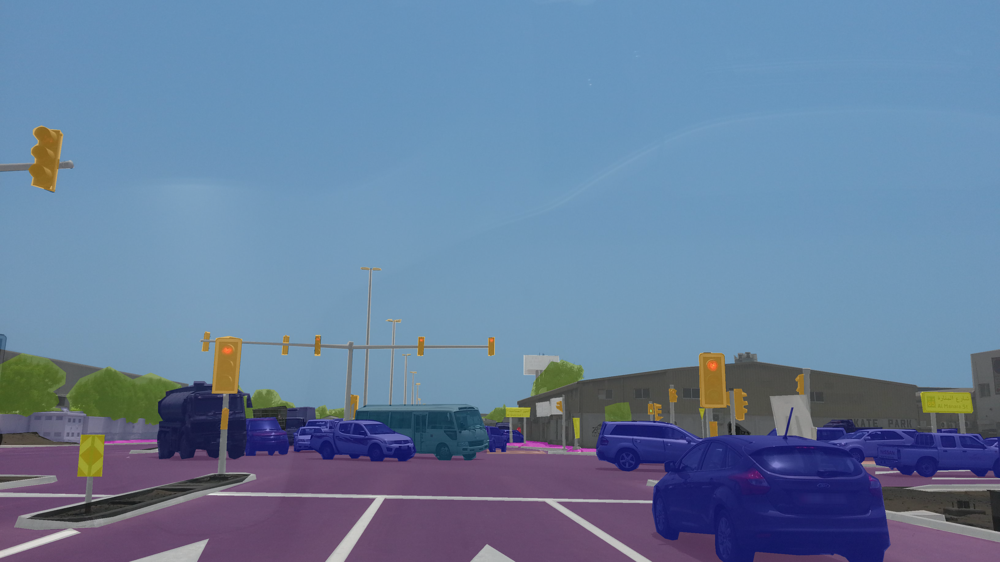

In [29]:
rgb_image = Image.open('/net/acadia10a/data/sparsh/mapillary/mapillary-2.0/validation/images/MQiqCRa0WEFsCoTxKCuUjA.jpg')
semantic_image = Image.open('/net/acadia10a/data/sparsh/mapillary/mapillary-2.0/validation/v1.2/labels/MQiqCRa0WEFsCoTxKCuUjA.png')
alpha = 0.5  # 0.5 means 50% transparency for each image
blended_image = Image.blend(rgb_image.convert("RGBA"), semantic_image.convert("RGBA"), alpha)

display(blended_image)

#### Observations

- In the above image, we can see, we have multiple instances of cars along with traffic-lights, we want them to convert it into different instances which we could localize better and make decisions faster

---------------------

#### Load Owl-v2 Detector and Visualize the Detector results

/tmp/ipykernel_643169/32915579.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df3 = df3.applymap(lambda x: int(round(x, 0)) if isinstance(x, (int, float)) else x)


,Label,xmin,ymin,xmax,ymax,Scores
0,traffic lights,54,411,226,628,0.319706
1,traffic lights,676,1088,1643,1172,0.208774
2,traffic lights,919,1097,953,1157,0.298691
3,traffic lights,1021,1096,1052,1156,0.245326
4,traffic lights,1359,1098,1390,1158,0.242995
5,traffic lights,1590,1100,1621,1159,0.280974
6,traffic lights,697,1113,786,1264,0.300723
7,traffic lights,2280,1153,2366,1323,0.293594
8,traffic signs,2394,1140,2462,1195,0.217478
9,traffic signs,2185,1264,2279,1309,0.247957


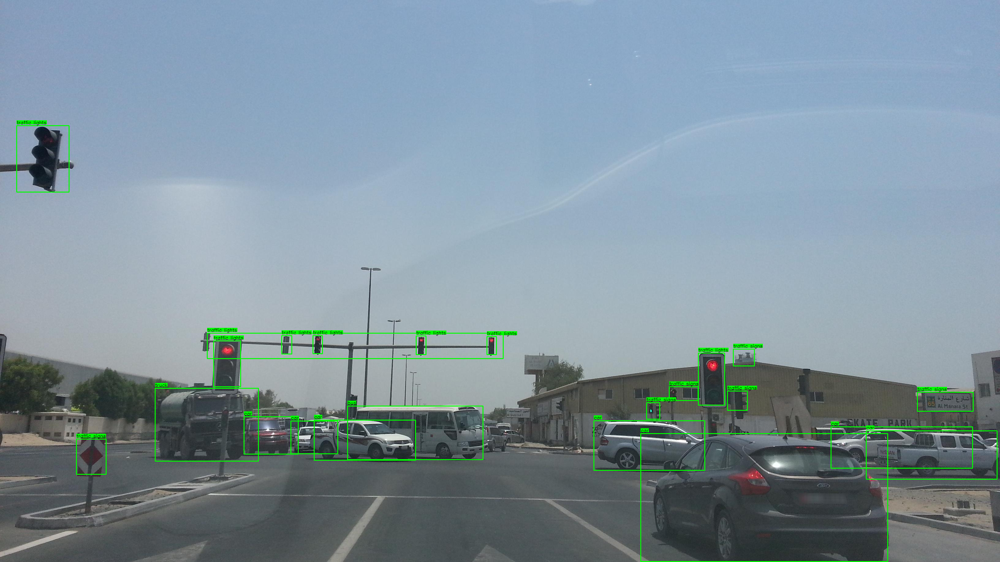

In [32]:
import pandas as pd
model_name = "google/owlvit-base-patch32"
model = OwlViTForObjectDetection.from_pretrained(model_name)
processor = OwlViTProcessor.from_pretrained(model_name)

def detect_objects(image, model, processor, labels):
    # Prepare the image for the model
    inputs = processor(text=labels, images=image, return_tensors="pt")

    # Perform object detection
    outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]])  # (H, W)
    results = processor.post_process_object_detection(
        outputs=outputs,
        target_sizes=target_sizes,
        threshold=0.2,  # Detection threshold
    )[0]
    
    # Extract bounding boxes, labels, and segmentation masks
    boxes = results["boxes"].detach().cpu().numpy()
    scores = results["scores"].detach().cpu().numpy()
    predicted_labels = [labels[i] for i in results["labels"].detach().cpu().numpy()]

    df = pd.DataFrame(list(zip(predicted_labels, boxes, scores)),
                   columns =['Label', 'Box', 'Scores'])

    df3 = pd.DataFrame(df['Box'].to_list(), columns=['xmin','ymin','xmax','ymax'])
    df3 = df3.applymap(lambda x: int(round(x, 0)) if isinstance(x, (int, float)) else x)
    df3['Label'] = df['Label']
    df3['Scores'] = df['Scores']
    df3 = df3[['Label', 'xmin','ymin','xmax','ymax', 'Scores']]
    display(df3)
    return boxes, predicted_labels, scores

def visualize_detector(image, boxes, labels):
    """
    Merge detections from patches and draw bounding boxes on the original image.

    Args:
        image (np.ndarray): Original image.
        detections (list): List of detections for each patch.
        positions (list): List of top-left corner coordinates for each patch.
        patch_size (int): Size of each patch.

    Returns:
        np.ndarray: Image with drawn bounding boxes and labels.
    """
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    thickness = 1
    #semantic_array = np.array(Image.open(semantic_mask))
    for box, label in zip(boxes, labels):
        # Adjust box coordinates to the original image
        x1, y1, x2, y2 = box

        # Draw bounding box
        cv2.rectangle(
            image,
            (int(x1), int(y1)),
            (int(x2), int(y2)),
            color=(0, 255, 0),
            thickness=2,
        )

        # Put label and score
        label_text = f"{label}"
        text_size = cv2.getTextSize(label_text, font, font_scale, thickness)[0]
        text_x = int(x1)
        text_y = int(y1) - 5
        if text_y < 0:  # Ensure text doesn't go out of bounds
            text_y = int(y1) + text_size[1] + 5
        cv2.rectangle(
            image,
            (text_x, text_y - text_size[1]),
            (text_x + text_size[0], text_y),
            (0, 255, 0),
            -1,
        )
        cv2.putText(
            image,
            label_text,
            (text_x, text_y),
            font,
            font_scale,
            (0, 0, 0),
            thickness,
        )
    return image


### list all the categories which you need to convert semantic to instances into below variable labels
labels = ["car", "truck", "signboard", "traffic lights", "traffic signs", "bus"] 

boxes, all_labels, scores = detect_objects(rgb_image, model, processor, labels)
output_image = visualize_detector(np.array(rgb_image), boxes, all_labels)

display(Image.fromarray(output_image))

#### Load SAM(Segment Anything)

(1836, 3264, 3)


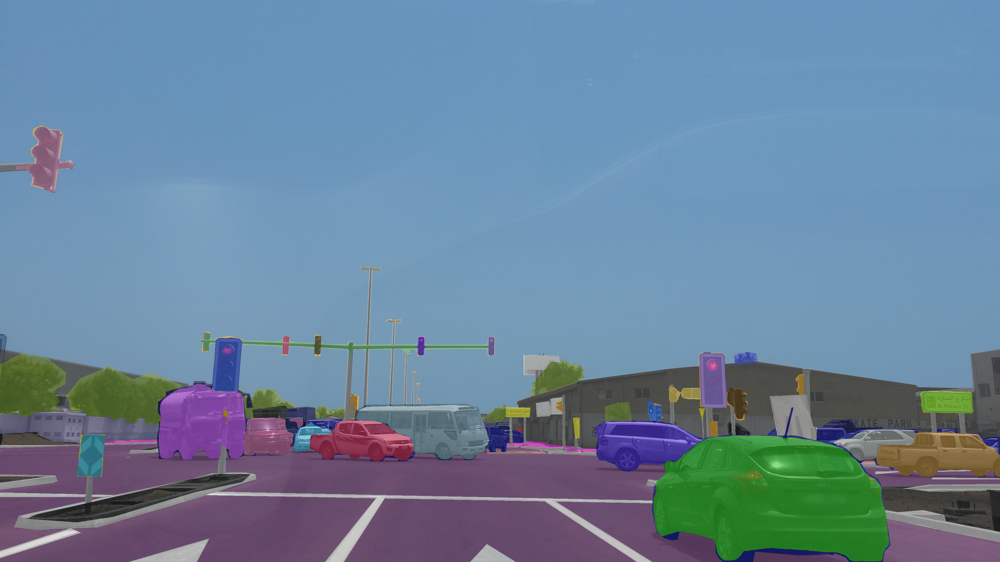

In [33]:
def generate_random_rgb():
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r, g, b)

def create_color_map(instance_mask):
    unique_ids = np.unique(instance_mask)
    color_map = {id_: generate_random_rgb() for id_ in unique_ids if id_ != 0}  # Exclude background ID 0
    return color_map
    
def colorize_instance_mask(instance_mask, color_map, semantic_image=None):
    # Initialize a blank RGB image
    height, width = instance_mask.shape
    print((height, width, 3))
    if not semantic_image:
        colorized_mask = np.zeros((height, width, 3), dtype=np.uint8)
    else:
        colorized_mask = np.array(semantic_image.convert('RGB'))
    for id_, color in color_map.items():
        
        colorized_mask[instance_mask == id_] = color
    
    return colorized_mask


def create_combined_mask(masks, ids):
    """
    Combines multiple masks into a single mask with unique IDs for each object.

    Args:
        masks (list of np.ndarray): List of binary masks (2D arrays) for different objects. 
                                   Each mask should have the same dimensions.
        ids (list of int): List of unique IDs corresponding to each mask.

    Returns:
        np.ndarray: Combined mask where each object's pixels are labeled with its unique ID.
    """
    # Check that the number of masks matches the number of IDs
    if len(masks) != len(ids):
        raise ValueError("The number of masks and IDs must be the same.")

    # Get the shape of the masks (all masks should have the same shape)
    mask_shape = masks[0].shape

    # Initialize the combined mask with zeros
    combined_mask = np.zeros(mask_shape, dtype=np.int32)

    for mask, obj_id in zip(masks, ids):
        # Ensure that the mask dimensions match the expected shape
        if mask.shape != mask_shape:
            raise ValueError("All masks must have the same dimensions.")

        # Add the mask to the combined mask with its corresponding ID
        combined_mask[mask > 0] = obj_id

    return combined_mask


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SamModel.from_pretrained("facebook/sam-vit-huge").to(device)
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")
all_masks = []
instances = []
ids = 1
for input_boxes in boxes:
    input_boxes = [int(i) for i in input_boxes.tolist()]
    input_boxes = [[input_boxes]]
    #input_boxes = [int(i) for i in input_boxes]
    inputs = processor(rgb_image, input_boxes=[input_boxes], return_tensors="pt").to(device)
    image_embeddings = model.get_image_embeddings(inputs["pixel_values"])
    inputs.pop("pixel_values", None)
    inputs.update({"image_embeddings": image_embeddings})
    
    with torch.no_grad():
        outputs = model(**inputs)
    masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())[0]
    i = masks.shape[1]-1
    mask = masks[0, i]  # Select the i-th mask of the first batch element
    mask = mask.squeeze()  # Remove single-dimensional entries
    mask = mask.numpy() * 1
    all_masks.append(mask)
    instances.append(ids)
    ids+=1
instance_mask = create_combined_mask(all_masks, instances)
color_map = create_color_map(instance_mask)
colorize_mask = Image.fromarray(colorize_instance_mask(instance_mask, color_map, semantic_image))

display(Image.blend(rgb_image, colorize_mask, 0.5))

#### Results
- Now you have instances of multiple cars, trucks and other objects which you asked in the owl-v2 detector